In [255]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import animation, rc
from IPython.display import HTML
from scipy.fft import fft, ifft


parameters

In [256]:
L = 1  # Length of the domain
T = 1   # Total simulation time
nx = 50  # Number of spatial points
nt = 100  # Number of time steps
dx = L / (nx)  # Spatial step size
dt = T / nt  # Time step size
c = 1.0  # Wave speed

Finite differences: RK4

In [317]:
# Initialize arrays
#x = np.linspace(0, L, nx)
u = np.zeros((nt, nx))   # Array to store the solution at each time step
v = np.zeros((nt,nx))         # Initial velocity

# Initial condition
u_init = np.zeros(nx)
for i in range(nx):
    x = dx * i
    u_init[i] = np.sin((10*np.pi/L)*x)
    #u_init[i] = np.sin((2*np.pi/L)*x)
    
#u_init[0]=u_init[-1]

u[0,:] = u_init

def source_term(x,t):
    return 10*np.sin(4* np.pi * t)*np.sin(4* np.pi * x)
    #return 0


# Source term 
source = np.zeros((nt,nx))  
for i in range(nx):
    x = dx * i
    for j in range(nt):
        t = dt * j 
        source[j , i] = source_term(x,t)
        source[j,0] = source[j, -1]

# RK4 time-stepping
for n in range(nt-1):
    k1u = dt * v[n]
    k1v = (c ** 2) * dt * (np.roll(u[n], -1) - 2*u[n] + np.roll(u[n], 1)) / (dx ** 2) + dt * source[n]
    
    k2u = dt * (v[n] + 0.5 * k1v)
    k2v = (c ** 2) * dt * (np.roll(u[n]+ 0.5 * k1u, -1) - 2*(u[n]+ 0.5 * k1u) + np.roll(u[n]+ 0.5 * k1u, 1)) / (dx ** 2) + dt*source[n]+ 0.5 * k1u
    
    k3u = dt * (v[n] + 0.5 * k2v)
    k3v = (c ** 2) * dt * (np.roll(u[n]+ 0.5 * k2u, -1) - 2*(u[n]+ 0.5 * k2u) + np.roll(u[n]+ 0.5 * k2u, 1)) / (dx ** 2) + dt*source[n]+ 0.5 * k2u
    
    k4u = dt * (v[n] + k3v)
    k4v = (c ** 2) * dt * (np.roll(u[n]+ 0.5 * k3u, -1) - 2*(u[n]+ 0.5 * k3u) + np.roll(u[n]+ 0.5 * k3u, 1)) / (dx ** 2)+ dt*source[n]+ 0.5 * k3u
    
    u[n + 1] = u[n] + (k1u + 2 * k2u + 2 * k3u+ k4u) / 6 + dt * source[n]
    u[n,0] = u[n, -1]
    v[n+1] = (k1v + 2 * k2v + 2 * k3v + k4v) / 6
    v[n,0] = v[n, -1]

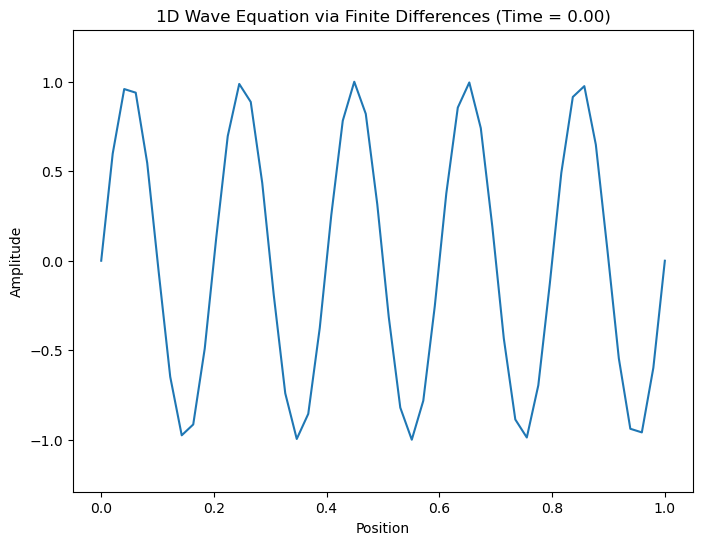

In [318]:
# Animation function
def animate(i):
    plt.clf()
    #read as: at each time i, plot all of space
    plt.plot(np.linspace(0, L, nx), u[i, :])
    plt.xlabel('Position')
    plt.ylabel('Amplitude')
    plt.ylim(np.min(u), np.max(u))
    plt.title(f'1D Wave Equation via Finite Differences (Time = {i * dt:.2f})')

# Create animation
fig = plt.figure(figsize=(8, 6))
#interval changes speed of animation
anim = animation.FuncAnimation(fig, animate, frames=nt, interval=30)
HTML(anim.to_jshtml())

Spectral methods

In [319]:
#spatial grid
x_grid = np.linspace(0, L, nx)
dx = x_grid[1] - x_grid[0]

us = np.zeros((nt, nx) )  # Array to store the solution at each time step
vs = np.zeros((nt, nx))      # Initial velocity

# Define the Fourier modes
freqs= np.fft.fftfreq(nx, d=dx)
k = 2.0 * np.pi * freqs

# Initial condition
us[0,:] = u_init
#us[0,-1] = us[0,0]

# Solve time ODE with RK4
for n in range(nt -1):
    # Fourier transform of u and v, at each time step
    uft = np.fft.fft(us[n,:])
    vft = np.fft.fft(vs[n,:])
    
    # Source term in Fourier space, for each time
    sourcehat = np.fft.fft(source[n, :])
    
    # RK4 method
    k1u = dt * vft
    k1v = -dt *(c*k)**2 * uft + dt * sourcehat
    
    k2u = dt * (vft + 0.5 * k1v)
    k2v = -dt * (c * k)**2 * (uft + 0.5 * k1u) + dt * sourcehat
    
    k3u = dt * (vft + 0.5 * k2v)
    k3v = -dt * (c * k)**2 * (uft + 0.5 * k2u) + dt * sourcehat
    
    k4u = dt * (vft + k3v)
    k4v = -dt * (c * k)**2 * (uft + k3u) + dt * sourcehat

    #next time step
    uft_1 = uft + (k1u + 2 * k2u + 2 * k3u + k4u) / 6 + dt * sourcehat
    vft_1 = (k1v + 2 * k2v + 2 * k3v + k4v) / 6

    #back to real space and repeat the loop
    us[n+1,:] = np.fft.ifft(uft_1).real
    vs[n+1,:] = np.fft.ifft(vft_1).real
    #periodic bc
    us[n,0] = us[n, -1]
    vs[n,0] = vs[n, -1]


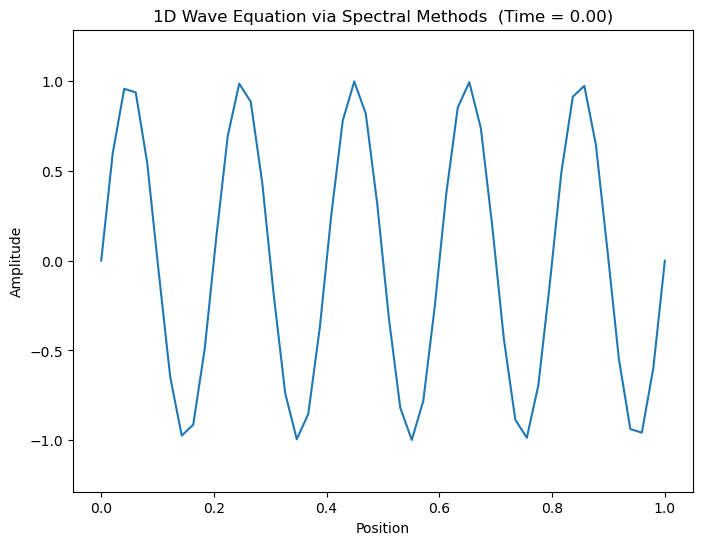

In [320]:
def animate(i):
    plt.clf()
    plt.plot(np.linspace(0, L, nx), us[i, :])
    plt.xlabel('Position')
    plt.ylabel('Amplitude')
    plt.ylim(np.min(us), np.max(us))
    plt.title(f'1D Wave Equation via Spectral Methods  (Time = {i * dt:.2f})')

# Create animation
fig = plt.figure(figsize=(8, 6))
#interval changes speed of animation
anim = animation.FuncAnimation(fig, animate, frames=nt, interval=30)
HTML(anim.to_jshtml())

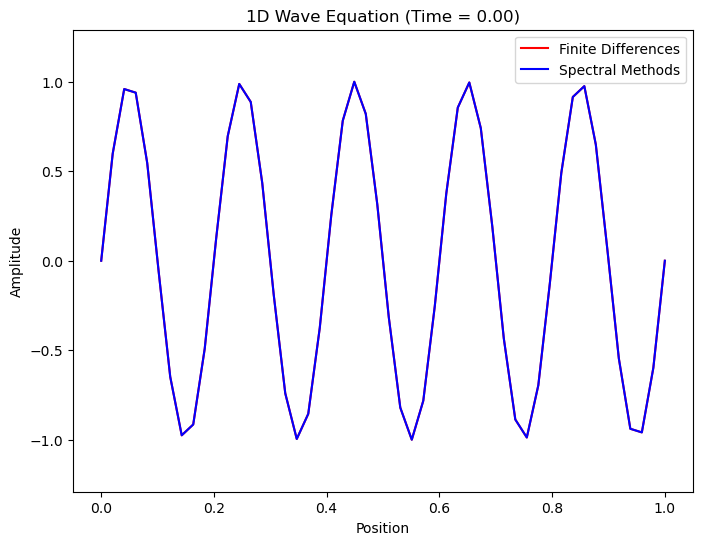

In [321]:
# Animation function
def animate(i):
    plt.clf()
    plt.plot(np.linspace(0, L, nx), u[i, :], color='red', label ='Finite Differences')
    plt.xlabel('Position')
    plt.ylabel('Amplitude')
    plt.plot(np.linspace(0, L, nx), us[i, :], color='blue', label='Spectral Methods')
    plt.legend()
    plt.ylim(min(np.min(us), np.min(u)), max(np.max(us),np.max(u)))
    plt.title(f'1D Wave Equation (Time = {i * dt:.2f})')

# Create animation
fig = plt.figure(figsize=(8, 6))
#interval changes speed of animation
anim = animation.FuncAnimation(fig, animate, frames=nt, interval=30)
HTML(anim.to_jshtml())